# General Pre formatting

### Loading dataset

In [652]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
sns.set()

In [653]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [654]:
df=pd.read_csv("drive/MyDrive/Colab Notebooks/ML assignment/weatherHistory.csv")

In [655]:
df.head()

,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
3,2006-04-01 03:00:00.000 +0200,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
4,2006-04-01 04:00:00.000 +0200,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.


### Removing duplicate values

In [656]:
duplicates = df[df.duplicated(keep=False)]
duplicates.shape[0]

48

In [657]:
df = df.drop_duplicates(keep='first')
duplicates = df[df.duplicated(keep=False)]
duplicates.shape[0]

0

### Changing Formatted Date into date datatype

In [658]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96429 entries, 0 to 96452
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Formatted Date            96429 non-null  object 
 1   Summary                   96429 non-null  object 
 2   Precip Type               95912 non-null  object 
 3   Temperature (C)           96429 non-null  float64
 4   Apparent Temperature (C)  96429 non-null  float64
 5   Humidity                  96429 non-null  float64
 6   Wind Speed (km/h)         96429 non-null  float64
 7   Wind Bearing (degrees)    96429 non-null  float64
 8   Visibility (km)           96429 non-null  float64
 9   Loud Cover                96429 non-null  float64
 10  Pressure (millibars)      96429 non-null  float64
 11  Daily Summary             96429 non-null  object 
dtypes: float64(8), object(4)
memory usage: 9.6+ MB


In [659]:
# Extract the desired format of time (without milliseconds and zone)
df['Formatted Date'] = df['Formatted Date'].str.extract(r'(\d{4}-\d{2}-\d{2} \d{2}:\d{2}:\d{2})')[0]

In [660]:
df.head()

,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
0,2006-04-01 00:00:00,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
3,2006-04-01 03:00:00,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
4,2006-04-01 04:00:00,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.


In [661]:
# Convert the "Formatted Date" column to datetime
df['Formatted Date'] = pd.to_datetime(df['Formatted Date'], format="%Y-%m-%d %H:%M:%S")

In [662]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96429 entries, 0 to 96452
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Formatted Date            96429 non-null  datetime64[ns]
 1   Summary                   96429 non-null  object        
 2   Precip Type               95912 non-null  object        
 3   Temperature (C)           96429 non-null  float64       
 4   Apparent Temperature (C)  96429 non-null  float64       
 5   Humidity                  96429 non-null  float64       
 6   Wind Speed (km/h)         96429 non-null  float64       
 7   Wind Bearing (degrees)    96429 non-null  float64       
 8   Visibility (km)           96429 non-null  float64       
 9   Loud Cover                96429 non-null  float64       
 10  Pressure (millibars)      96429 non-null  float64       
 11  Daily Summary             96429 non-null  object        
dtypes: datetime64[ns](

### Setting index as Formatted Date

In [663]:
df.set_index(['Formatted Date'], inplace=True)
df.head()

,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
Formatted Date,,,,,,,,,,,
2006-04-01 00:00:00,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
2006-04-01 01:00:00,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2006-04-01 02:00:00,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
2006-04-01 03:00:00,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
2006-04-01 04:00:00,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.


### Sorting dataframe in timeorder

In [664]:
df = df.sort_index()
df.head()

,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
Formatted Date,,,,,,,,,,,
2006-01-01 00:00:00,Partly Cloudy,rain,0.577778,-4.050000,0.89,17.1143,140.0,9.9820,0.0,1016.66,Mostly cloudy throughout the day.
2006-01-01 01:00:00,Mostly Cloudy,rain,1.161111,-3.238889,0.85,16.6152,139.0,9.9015,0.0,1016.15,Mostly cloudy throughout the day.
2006-01-01 02:00:00,Mostly Cloudy,rain,1.666667,-3.155556,0.82,20.2538,140.0,9.9015,0.0,1015.87,Mostly cloudy throughout the day.
2006-01-01 03:00:00,Overcast,rain,1.711111,-2.194444,0.82,14.4900,140.0,9.9015,0.0,1015.56,Mostly cloudy throughout the day.
2006-01-01 04:00:00,Mostly Cloudy,rain,1.183333,-2.744444,0.86,13.9426,134.0,9.9015,0.0,1014.98,Mostly cloudy throughout the day.


### Dropping column that does not show any variation

In [665]:
df.describe(include='all')

,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
count,96429,95912,96429.000000,96429.000000,96429.000000,96429.000000,96429.000000,96429.000000,96429.0,96429.000000,96429
unique,27,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,214
top,Partly Cloudy,rain,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mostly cloudy throughout the day.
freq,31726,85200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20085
mean,NaN,NaN,11.929692,10.851707,0.734902,10.812460,187.497506,10.347225,0.0,1003.232915,NaN
std,NaN,NaN,9.550492,10.695743,0.195466,6.913345,107.376423,4.192548,0.0,116.984300,NaN
min,NaN,NaN,-21.822222,-27.716667,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,NaN
25%,NaN,NaN,4.683333,2.311111,0.600000,5.828200,116.000000,8.339800,0.0,1011.900000,NaN
50%,NaN,NaN,12.000000,12.000000,0.780000,9.965900,180.000000,10.046400,0.0,1016.450000,NaN
75%,NaN,NaN,18.838889,18.838889,0.890000,14.135800,290.000000,14.812000,0.0,1021.090000,NaN


In [666]:
# dropping Loud Cover column since it does not show any variation among the column
df = df.drop(columns=['Loud Cover'])

# Question - Part a => Preprocessing

## Part a - Part 1 - Missing value handling

### Check which column has null values

In [667]:
null_columns = df.columns[df.isnull().any()]

# Now, 'null_columns' will contain the names of columns with null values
if null_columns.empty:
    print("No columns have null values.")
else:
    print("Columns with null values:")
    for col in null_columns:
        print(f"{col}: {df[col].isnull().sum()} null values")

Columns with null values:
Precip Type: 517 null values


In [668]:
# Assuming 'df' is your DataFrame
precip_type_counts = df['Precip Type'].value_counts()

# Print the unique values and their counts
precip_type_counts


rain    85200
snow    10712
Name: Precip Type, dtype: int64

Since it's timeseries data - dropping null values are not good practice. So we need to impute them.

### See the variation of missing column

In [669]:
import plotly.express as px
import pandas as pd

# Assuming 'df' is your DataFrame with a datetime index
# Create a new DataFrame to store the data for plotting
plot_df = pd.DataFrame({'Time': df.index, 'Precip Type': df['Precip Type']})

# Replace null values with 'Null' to label them properly
plot_df['Precip Type'].fillna('Null', inplace=True)

# Create an interactive scatter plot using Plotly Express
fig = px.scatter(plot_df, x='Time', y='Precip Type', color='Precip Type',
                 color_discrete_map={'rain': 'blue', 'snow': 'red', 'Null': 'gray'},
                 labels={'Precip Type': 'Precip'},
                 title='Precip Type Over Time')

# Update x-axis and y-axis labels
fig.update_xaxes(title='Time')
fig.update_yaxes(title='Precip')

# Show the interactive plot
fig.show()


From the above graph we can make the decision of imputing the Precip column with value "rain". Since nearboughhood of missing values are rain.

### Imputing "Precip Type" column using forwardfill method

In [670]:
# Replace missing values in the 'Precip' column with forward fill method
df['Precip Type'].fillna(method='ffill', inplace=True)


In [671]:
null_columns = df.columns[df.isnull().any()]

# Now, 'null_columns' will contain the names of columns with null values
if null_columns.empty:
    print("No columns have null values.")
else:
    print("Columns with null values:")
    for col in null_columns:
        print(f"{col}: {df[col].isnull().sum()} null values")

No columns have null values.


## Part a - Part 1 - Outliers Handling

In [672]:
# Define the window size for the moving average and moving standard deviation
window_size =512 # I define window size for one month -->> 24*7*4

# Define a z-score threshold for identifying outliers (e.g., z-score > 3 or < -3)
z_score_threshold = 3

### Temperature

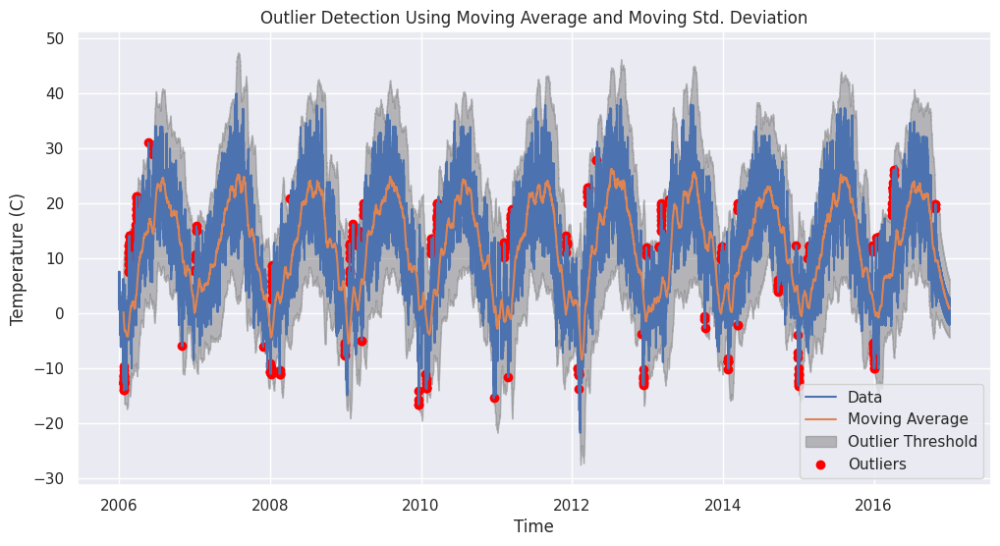

In [673]:
# Calculate the moving average and moving standard deviation
df['MovingAvg'] = df['Temperature (C)'].rolling(window=window_size).mean()
df['MovingStd'] = df['Temperature (C)'].rolling(window=window_size).std()

# Find the outliers based on the z-score
outliers = df[np.abs((df['Temperature (C)'] - df['MovingAvg']) / df['MovingStd']) > z_score_threshold]

# Create a plot
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Temperature (C)'], label='Data')
plt.plot(df.index, df['MovingAvg'], label='Moving Average')
plt.fill_between(df.index, df['MovingAvg'] - z_score_threshold * df['MovingStd'], df['MovingAvg'] + z_score_threshold * df['MovingStd'], color='gray', alpha=0.5, label='Outlier Threshold')
plt.scatter(outliers.index, outliers['Temperature (C)'], color='red', label='Outliers')
plt.legend()
plt.xlabel('Time')
plt.ylabel('Temperature (C)')
plt.title('Outlier Detection Using Moving Average and Moving Std. Deviation')
plt.show()

In [674]:
import plotly.graph_objects as go

# Create an interactive plot using Plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df['Temperature (C)'], mode='lines', name='Data'))
fig.add_trace(go.Scatter(x=df.index, y=df['MovingAvg'], mode='lines', name='Moving Average'))
fig.add_shape(type='rect',
              x0=df.index.min(),
              x1=df.index.max(),
              y0=df['MovingAvg'] - z_score_threshold * df['MovingStd'],
              y1=df['MovingAvg'] + z_score_threshold * df['MovingStd'],
              fillcolor='gray',
              opacity=0.5,
              name='Outlier Threshold')
fig.add_trace(go.Scatter(x=outliers.index, y=outliers['Temperature (C)'], mode='markers', name='Outliers', marker=dict(color='red')))
fig.update_layout(
    title='Outlier Detection Using Moving Average and Moving Std. Deviation',
    xaxis_title='Time',
    yaxis_title='Temperature (C)',
    showlegend=True
)
fig.show()

In [675]:
len(outliers)

417

In [676]:
# Replace outliers with the maximum or minimum of threshold bandwidth
for index, row in outliers.iterrows():
    z_score = (row['Temperature (C)'] - row['MovingAvg']) / row['MovingStd']

    if z_score > z_score_threshold:
        df.at[index, 'Temperature (C)'] = row['MovingAvg'] + (z_score_threshold * row['MovingStd'])
    elif z_score < -z_score_threshold:
        df.at[index, 'Temperature (C)'] = row['MovingAvg'] - (z_score_threshold * row['MovingStd'])

### Humidity

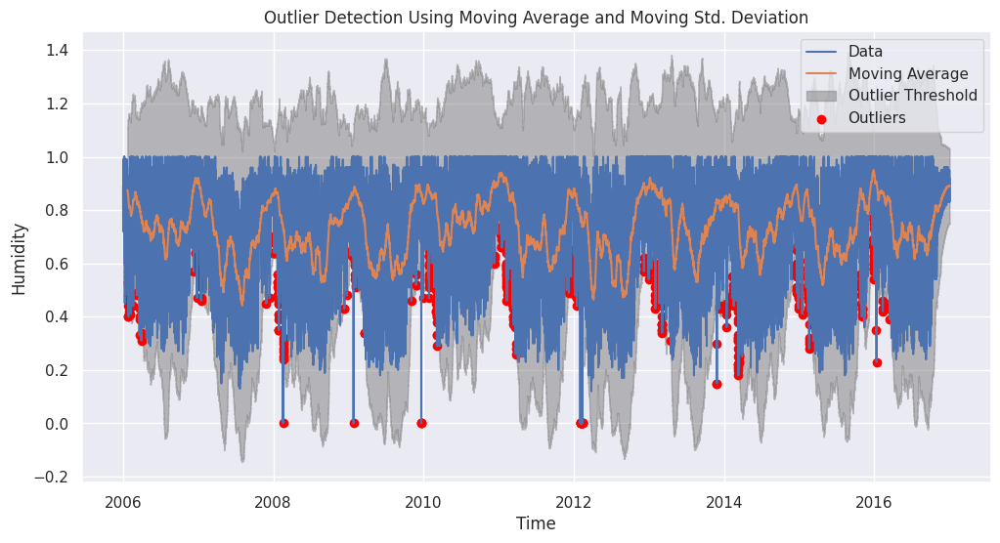

In [677]:
# Calculate the moving average and moving standard deviation
df['MovingAvg'] = df['Humidity'].rolling(window=window_size).mean()
df['MovingStd'] = df['Humidity'].rolling(window=window_size).std()

# Create an empty DataFrame
outliers = pd.DataFrame()

# Find the outliers based on the z-score
outliers = df[np.abs((df['Humidity'] - df['MovingAvg']) / df['MovingStd']) > z_score_threshold]

# Create a plot
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Humidity'], label='Data')
plt.plot(df.index, df['MovingAvg'], label='Moving Average')
plt.fill_between(df.index, df['MovingAvg'] - z_score_threshold * df['MovingStd'], df['MovingAvg'] + z_score_threshold * df['MovingStd'], color='gray', alpha=0.5, label='Outlier Threshold')
plt.scatter(outliers.index, outliers['Humidity'], color='red', label='Outliers')
plt.legend()
plt.xlabel('Time')
plt.ylabel('Humidity')
plt.title('Outlier Detection Using Moving Average and Moving Std. Deviation')
plt.show()

In [678]:
len(outliers)

456

In [679]:
# Replace outliers with the maximum or minimum of threshold bandwidth
for index, row in outliers.iterrows():
    z_score = (row['Humidity'] - row['MovingAvg']) / row['MovingStd']

    if z_score > z_score_threshold:
        df.at[index, 'Humidity'] = row['MovingAvg'] + (z_score_threshold * row['MovingStd'])
    elif z_score < -z_score_threshold:
        df.at[index, 'Humidity'] = row['MovingAvg'] - (z_score_threshold * row['MovingStd'])

### Wind Speed

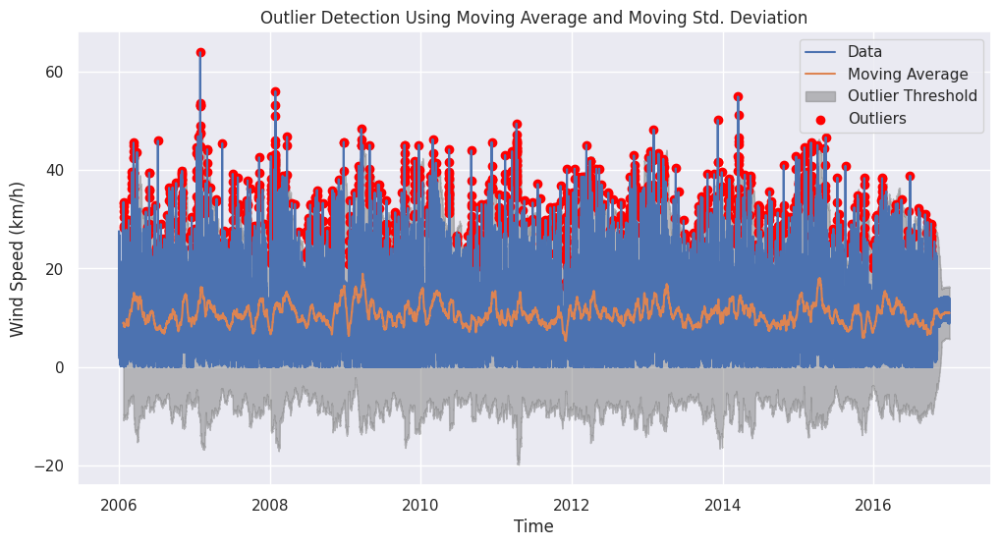

In [680]:
# Calculate the moving average and moving standard deviation
df['MovingAvg'] = df['Wind Speed (km/h)'].rolling(window=window_size).mean()
df['MovingStd'] = df['Wind Speed (km/h)'].rolling(window=window_size).std()

# Create an empty DataFrame
outliers = pd.DataFrame()

# Find the outliers based on the z-score
outliers = df[np.abs((df['Wind Speed (km/h)'] - df['MovingAvg']) / df['MovingStd']) > z_score_threshold]

# Create a plot
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Wind Speed (km/h)'], label='Data')
plt.plot(df.index, df['MovingAvg'], label='Moving Average')
plt.fill_between(df.index, df['MovingAvg'] - z_score_threshold * df['MovingStd'], df['MovingAvg'] + z_score_threshold * df['MovingStd'], color='gray', alpha=0.5, label='Outlier Threshold')
plt.scatter(outliers.index, outliers['Wind Speed (km/h)'], color='red', label='Outliers')
plt.legend()
plt.xlabel('Time')
plt.ylabel('Wind Speed (km/h)')
plt.title('Outlier Detection Using Moving Average and Moving Std. Deviation')
plt.show()

In [681]:
len(outliers)

1247

In [682]:
# Replace outliers with the maximum or minimum of threshold bandwidth
for index, row in outliers.iterrows():
    z_score = (row['Wind Speed (km/h)'] - row['MovingAvg']) / row['MovingStd']

    if z_score > z_score_threshold:
        df.at[index, 'Wind Speed (km/h)'] = row['MovingAvg'] + (z_score_threshold * row['MovingStd'])
    elif z_score < -z_score_threshold:
        df.at[index, 'Wind Speed (km/h)'] = row['MovingAvg'] - (z_score_threshold * row['MovingStd'])

### Visibility (km)

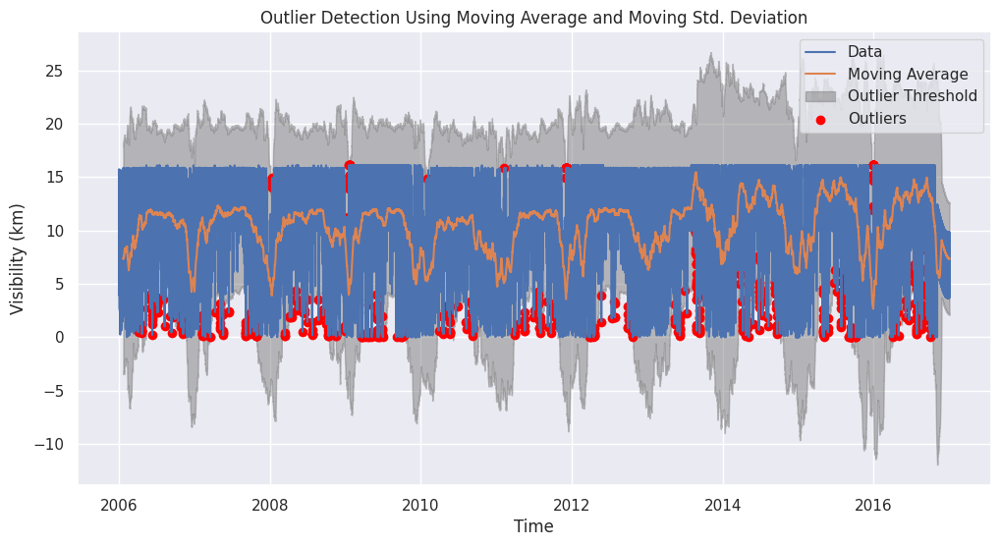

In [683]:
# Calculate the moving average and moving standard deviation
df['MovingAvg'] = df['Visibility (km)'].rolling(window=window_size).mean()
df['MovingStd'] = df['Visibility (km)'].rolling(window=window_size).std()


# Create an empty DataFrame
outliers = pd.DataFrame()

# Find the outliers based on the z-score
outliers = df[np.abs((df['Visibility (km)'] - df['MovingAvg']) / df['MovingStd']) > z_score_threshold]

# Create a plot
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Visibility (km)'], label='Data')
plt.plot(df.index, df['MovingAvg'], label='Moving Average')
plt.fill_between(df.index, df['MovingAvg'] - z_score_threshold * df['MovingStd'], df['MovingAvg'] + z_score_threshold * df['MovingStd'], color='gray', alpha=0.5, label='Outlier Threshold')
plt.scatter(outliers.index, outliers['Visibility (km)'], color='red', label='Outliers')
plt.legend()
plt.xlabel('Time')
plt.ylabel('Visibility (km)')
plt.title('Outlier Detection Using Moving Average and Moving Std. Deviation')
plt.show()

In [684]:
len(outliers)

651

In [685]:
# Replace outliers with the maximum or minimum of threshold bandwidth
for index, row in outliers.iterrows():
    z_score = (row['Visibility (km)'] - row['MovingAvg']) / row['MovingStd']

    if z_score > z_score_threshold:
        df.at[index, 'Visibility (km)'] = row['MovingAvg'] + (z_score_threshold * row['MovingStd'])
    elif z_score < -z_score_threshold:
        df.at[index, 'Visibility (km)'] = row['MovingAvg'] - (z_score_threshold * row['MovingStd'])

### Pressure

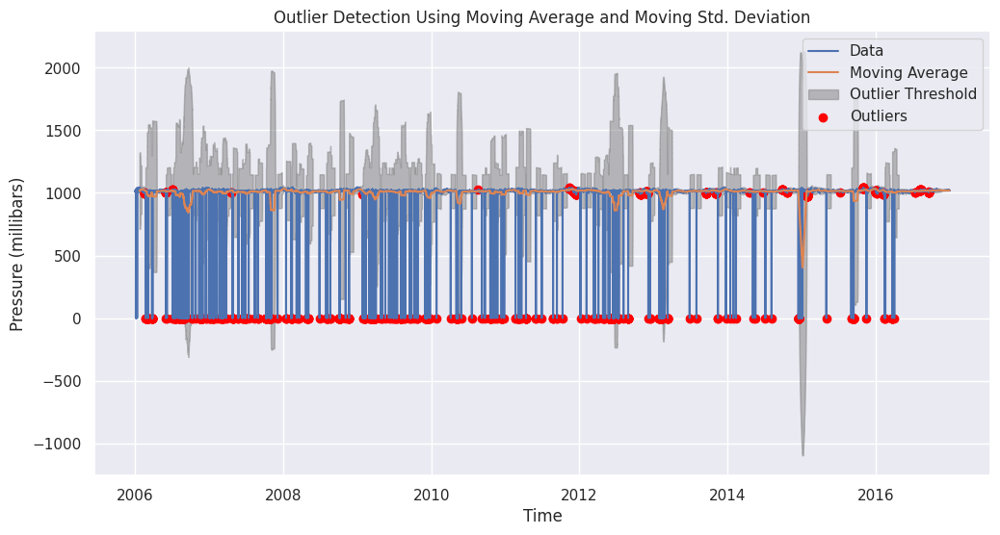

In [686]:
# Calculate the moving average and moving standard deviation
df['MovingAvg'] = df['Pressure (millibars)'].rolling(window=window_size).mean()
df['MovingStd'] = df['Pressure (millibars)'].rolling(window=window_size).std()

# Create an empty DataFrame
outliers = pd.DataFrame()

# Find the outliers based on the z-score
outliers = df[np.abs((df['Pressure (millibars)'] - df['MovingAvg']) / df['MovingStd']) > z_score_threshold]

# Create a plot
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Pressure (millibars)'], label='Data')
plt.plot(df.index, df['MovingAvg'], label='Moving Average')
plt.fill_between(df.index, df['MovingAvg'] - z_score_threshold * df['MovingStd'], df['MovingAvg'] + z_score_threshold * df['MovingStd'], color='gray', alpha=0.5, label='Outlier Threshold')
plt.scatter(outliers.index, outliers['Pressure (millibars)'], color='red', label='Outliers')
plt.legend()
plt.xlabel('Time')
plt.ylabel('Pressure (millibars)')
plt.title('Outlier Detection Using Moving Average and Moving Std. Deviation')
plt.show()

In [687]:
len(outliers)

1296

In [688]:
# Replace outliers with the maximum or minimum of threshold bandwidth
for index, row in outliers.iterrows():
    z_score = (row['Pressure (millibars)'] - row['MovingAvg']) / row['MovingStd']

    if z_score > z_score_threshold:
        df.at[index, 'Pressure (millibars)'] = row['MovingAvg'] + (z_score_threshold * row['MovingStd'])
    elif z_score < -z_score_threshold:
        df.at[index, 'Pressure (millibars)'] = row['MovingAvg'] - (z_score_threshold * row['MovingStd'])

In [689]:
# Additionally put column for outlier handling
df = df.drop(columns=['MovingAvg'])

In [690]:
# Additionally put column for outlier handling
df = df.drop(columns=['MovingStd'])

# Question b - part 2

For the easiness I have changed the order of the question

## Printing covariance matrix

<ipython-input-691-732e0fc256b4>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

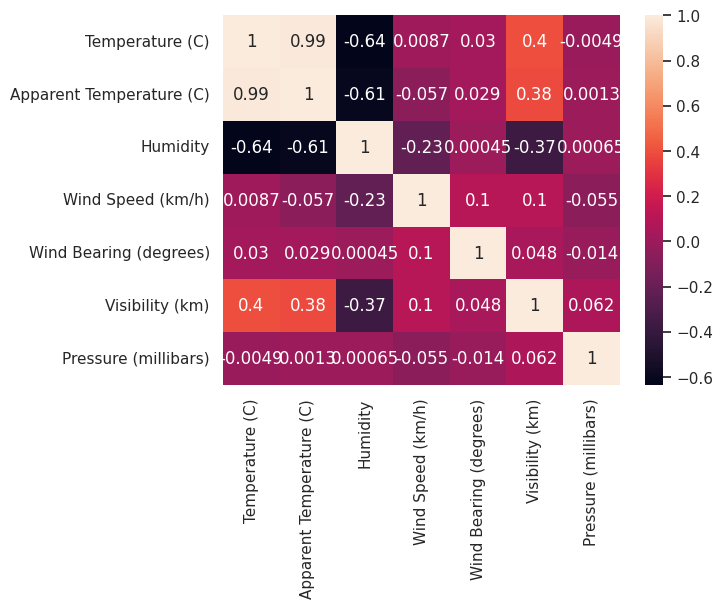

In [691]:
# Heatmap
sns.heatmap(df.corr(), annot = True)

## Dropping Redundant variable

In [692]:
df.drop('Apparent Temperature (C)', axis=1, inplace=True) # Redundant feature with temperature

## Dropping Insignificant variables

If value of covariance matrix is between 0.1 to -0.1 for X variables with Temperature, then we can able to consider them as insignificant and able to remove them

In [693]:
df.drop(columns=['Wind Speed (km/h)','Pressure (millibars)'], inplace=True) # These are insignificant with target variable Temperature

In [694]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 96429 entries, 2006-01-01 00:00:00 to 2016-12-31 23:00:00
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Summary                 96429 non-null  object 
 1   Precip Type             96429 non-null  object 
 2   Temperature (C)         96429 non-null  float64
 3   Humidity                96429 non-null  float64
 4   Wind Bearing (degrees)  96429 non-null  float64
 5   Visibility (km)         96429 non-null  float64
 6   Daily Summary           96429 non-null  object 
dtypes: float64(4), object(3)
memory usage: 7.9+ MB


# Question a

## Part a - Part 2 => Transformation

No need to do transformation for Y variable - So haven't draw Q-Q plot or histogram for Temperature

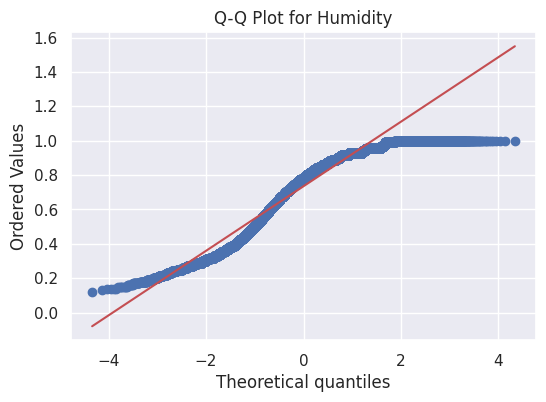

In [695]:
humidity = df['Humidity']

# Generate a Q-Q plot
fig, ax = plt.subplots(figsize=(6, 4))
stats.probplot(humidity, dist='norm', plot=ax)
ax.set_title('Q-Q Plot for Humidity')
plt.show()

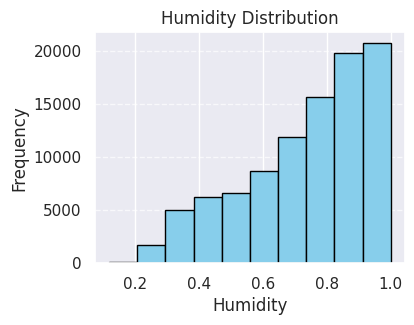

In [696]:
humidity = df['Humidity']

# Create a histogram with the default number of bins
plt.figure(figsize=(4, 3))
plt.hist(humidity, color='skyblue', edgecolor='black')  # No 'bins' parameter specified
plt.title('Humidity Distribution')
plt.xlabel('Humidity')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

It is negatively skewed distribution, since it's value is in between 0 and 1,  can do receprocal transformation, but it doesn't increase the accuracy for me. So I remove that code.

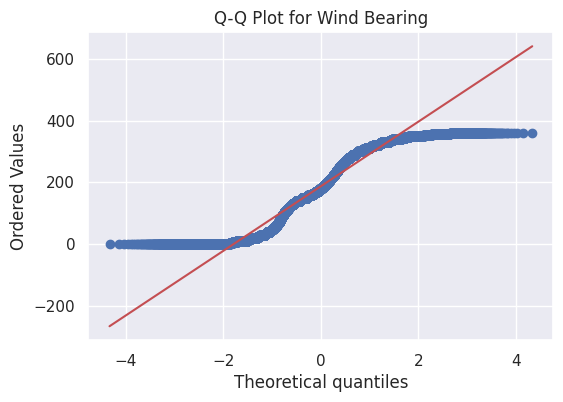

In [697]:
Wind_Bearing = df['Wind Bearing (degrees)']

# Generate a Q-Q plot
fig, ax = plt.subplots(figsize=(6, 4))
stats.probplot(Wind_Bearing, dist='norm', plot=ax)
ax.set_title('Q-Q Plot for Wind Bearing')
plt.show()

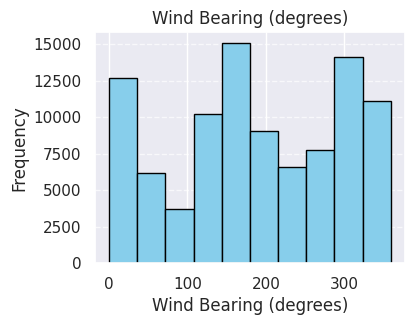

In [698]:
Wind_Bearing = df['Wind Bearing (degrees)']

# Create a histogram with the default number of bins
plt.figure(figsize=(4, 3))
plt.hist(Wind_Bearing, color='skyblue', edgecolor='black')  # No 'bins' parameter specified
plt.title('Wind Bearing (degrees)')
plt.xlabel('Wind Bearing (degrees)')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

No need of transformation - Since it is not skewed

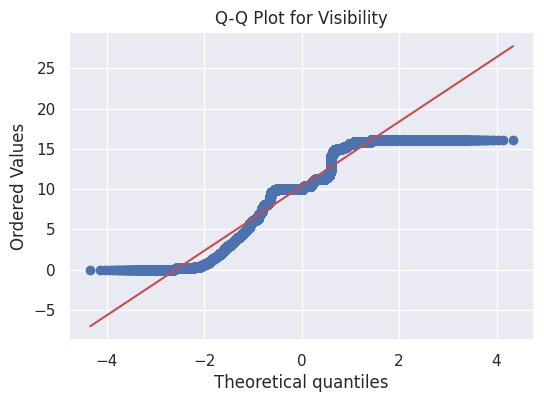

In [699]:
visibility = df['Visibility (km)']

# Generate a Q-Q plot
fig, ax = plt.subplots(figsize=(6, 4))
stats.probplot(visibility, dist='norm', plot=ax)
ax.set_title('Q-Q Plot for Visibility')
plt.show()

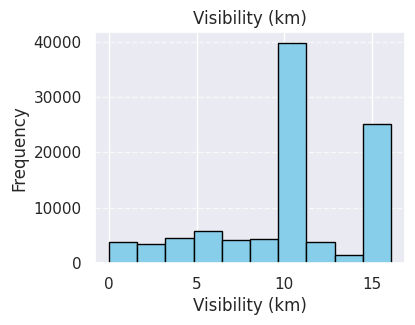

In [700]:
visibility = df['Visibility (km)']

# Create a histogram with the default number of bins
plt.figure(figsize=(4, 3))
plt.hist(visibility, color='skyblue', edgecolor='black')  # No 'bins' parameter specified
plt.title('Visibility (km)')
plt.xlabel('Visibility (km)')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

No need of transformation - Since it is not skewed

## Part a - Part 3 => Feature Encoding

In [701]:
# Assuming df is your DataFrame and 'Precip Type' is the column to one-hot encode
one_hot_encoded = pd.get_dummies(df['Precip Type'], prefix='Precip_Type')

# Add the one-hot encoded columns back to the original DataFrame
df = pd.concat([df, one_hot_encoded], axis=1)

# Drop the original 'Precip Type' column if you want to remove it
df = df.drop(columns=['Precip Type'])

If we haven't do the one-hot encoding for precip type, it decreases the accuracy of the model to 40%

In [702]:
unique_counts = df['Summary'].value_counts()
print(unique_counts)

Partly Cloudy                          31726
Mostly Cloudy                          28094
Overcast                               16597
Clear                                  10873
Foggy                                   7148
Breezy and Overcast                      528
Breezy and Mostly Cloudy                 516
Breezy and Partly Cloudy                 386
Dry and Partly Cloudy                     86
Windy and Partly Cloudy                   67
Light Rain                                63
Breezy                                    54
Windy and Overcast                        45
Humid and Mostly Cloudy                   40
Drizzle                                   39
Windy and Mostly Cloudy                   35
Breezy and Foggy                          35
Dry                                       34
Humid and Partly Cloudy                   17
Dry and Mostly Cloudy                     14
Rain                                      10
Windy                                      8
Humid and 

Below code if for Integer Label coding, it decreases the accuracy of the model

In [703]:
#from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder instance
#label_encoder = LabelEncoder()

# Fit and transform the 'Summary' column to obtain integer-encoded values
#df['Summary'] = label_encoder.fit_transform(df['Summary'])

# You can now use df['Summary_encoded'] as the integer-encoded version of 'Summary'


Below code if for one hot encoding of Summary type, it also decreases the model accuracy

In [704]:
# Assuming df is your DataFrame and 'Precip Type' is the column to one-hot encode
#one_hot_encoded = pd.get_dummies(df['Summary'], prefix='Summary')

# Add the one-hot encoded columns back to the original DataFrame
#df = pd.concat([df, one_hot_encoded], axis=1)

# Drop the original 'Precip Type' column if you want to remove it
df = df.drop(columns=['Summary'])

In [705]:
unique_counts = df['Daily Summary'].value_counts()
len(unique_counts)

214

In [706]:
# Since it has lot of unique values - Mentioning same things in two words - I have dropped Daily Summary column
df = df.drop(columns=['Daily Summary'])

In [707]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 96429 entries, 2006-01-01 00:00:00 to 2016-12-31 23:00:00
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Temperature (C)         96429 non-null  float64
 1   Humidity                96429 non-null  float64
 2   Wind Bearing (degrees)  96429 non-null  float64
 3   Visibility (km)         96429 non-null  float64
 4   Precip_Type_rain        96429 non-null  uint8  
 5   Precip_Type_snow        96429 non-null  uint8  
dtypes: float64(4), uint8(2)
memory usage: 5.9 MB




## Part a - Part 4 => Standardization

In [708]:
import numpy as np
from sklearn.preprocessing import StandardScaler

# Extract the columns you want to standardize
columns_to_standardize = df[['Humidity', 'Wind Bearing (degrees)', 'Visibility (km)']]

# Create a StandardScaler object
scaler = StandardScaler()

# Fit the scaler to the data and transform the data
standardized_data = scaler.fit_transform(columns_to_standardize)

# Replace the original columns with the standardized values
df[['Humidity', 'Wind Bearing (degrees)', 'Visibility (km)']] = standardized_data


In [709]:
# create the scaler object
#scaler = MinMaxScaler()

#data = pd.DataFrame(df, columns=['Humidity', 'Wind Bearing (degrees)', 'Visibility (km)'])
# fit the scaler to the  data
#scaler.fit(data)

#train_scaled = scaler.transform(data)
#new_df = pd.DataFrame(train_scaled, index=data.index, columns=['Humidity', 'Wind Bearing (degrees)', 'Visibility (km)'])
#df.update(new_df)

In [710]:
df.head()

,Temperature (C),Humidity,Wind Bearing (degrees),Visibility (km),Precip_Type_rain,Precip_Type_snow
Formatted Date,,,,,,
2006-01-01 00:00:00,0.577778,0.793859,-0.442348,-0.089375,1,0
2006-01-01 01:00:00,1.161111,0.588702,-0.451661,-0.108653,1,0
2006-01-01 02:00:00,1.666667,0.434834,-0.442348,-0.108653,1,0
2006-01-01 03:00:00,1.711111,0.434834,-0.442348,-0.108653,1,0
2006-01-01 04:00:00,1.183333,0.639991,-0.498227,-0.108653,1,0


## Part a - Part 5 => Discretization

 Humidity, Wind Bearing (degrees), and  Visibility(km)                             are in float values -->> But since need to calculate temperature which is a regression task (not a classification), that's why we **don't** need to do discretization here. Becuase it has high chance to decrease the accuracy when we do discretization

# Question - Part b => Feature Extraction

### Setting X and Y variables

In [711]:
X = df.drop(columns=['Temperature (C)'])  # Features (all columns except the target)
y = df['Temperature (C)']  # Target variable

## Part b - Part 1 => PCA - Principal Component Analysis

Here I have done PCA, but it decreases the accuracy value, So I have commented PCA code -->> I have tried for different PCA component values 2,3,...



In [712]:
#pca = PCA()
#X_pca = pca.fit_transform(X)
#X_reduced = PCA(n_components=2).fit_transform(X)

In [713]:
#principalDf = pd.DataFrame(data = X_reduced, index=df.index)
#principalDf.head(10)

## Part b - Part 2

For the easiness I have done the feature extraction using significance and Redundancy above Question a - part 2

# Question - Part c => Regression

Since I am doing this as the time series data, inorder to maintain temporal dependency, I have included "shuffle=False"

### Splitting dataset for training and testing

In [714]:
# Split the dataset into training and testing sets (e.g., 80% for training, 20% for testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle=False)

## Part c - Part 1 => Linear Regression

In [715]:
# Create a Linear Regression model
model = LinearRegression()

K = 10

# Initialize an array to store the predictions for each fold
test_predictions = np.zeros(len(X_test))

# Create a KFold cross-validator
kf = KFold(n_splits=K, shuffle=False)

# Convert X_train and X_test to NumPy arrays
X_train, X_test = X_train.values, X_test.values
y_train, y_test = y_train.values, y_test.values

# Iterate through the folds
for train_index, val_index in kf.split(X_train):
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # Fit the model on the training data for this fold
    model.fit(X_train_fold, y_train_fold)

    # Predict on the validation set for this fold
    val_predictions = model.predict(X_val_fold)

    # Store the predictions for the test dataset
    test_predictions += model.predict(X_test)

# Average the predictions over all folds to get the final predictions for the test dataset
test_predictions /= K

In [716]:
# Calculate MAE
mae = mean_absolute_error(y_test, test_predictions)

# Calculate MSE
mse = mean_squared_error(y_test, test_predictions)

# Calculate RMSE
rmse = np.sqrt(mse)

# Calculate R-squared (R2)
r2 = r2_score(y_test, test_predictions)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R2): {r2}")

Mean Absolute Error (MAE): 5.069924412389177
Mean Squared Error (MSE): 34.4706963941551
Root Mean Squared Error (RMSE): 5.871175043733162
R-squared (R2): 0.5783019563333542


## Part c - Part 2 => Lasso Regression

In [717]:
# Create a Linear Regression model
model = Lasso(alpha=0.01)

K = 10

# Initialize an array to store the predictions for each fold
test_predictions = np.zeros(len(X_test))

# Create a KFold cross-validator
kf = KFold(n_splits=K, shuffle=False)

# Iterate through the folds
for train_index, val_index in kf.split(X_train):
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # Fit the model on the training data for this fold
    model.fit(X_train_fold, y_train_fold)

    # Predict on the validation set for this fold
    val_predictions = model.predict(X_val_fold)

    # Store the predictions for the test dataset
    test_predictions += model.predict(X_test)

# Average the predictions over all folds to get the final predictions for the test dataset
test_predictions /= K

In [718]:
# Calculate MAE
mae = mean_absolute_error(y_test, test_predictions)

# Calculate MSE
mse = mean_squared_error(y_test, test_predictions)

# Calculate RMSE
rmse = np.sqrt(mse)

# Calculate R-squared (R2)
r2 = r2_score(y_test, test_predictions)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R2): {r2}")

Mean Absolute Error (MAE): 5.066476711303076
Mean Squared Error (MSE): 34.44439471479709
Root Mean Squared Error (RMSE): 5.868934717203548
R-squared (R2): 0.5786237185224204


## Part c - Part 3 => Ridge Regression

In [719]:
# Create a Linear Regression model
model = Ridge(alpha=10.0)

K = 10

# Initialize an array to store the predictions for each fold
test_predictions = np.zeros(len(X_test))

# Create a KFold cross-validator
kf = KFold(n_splits=K, shuffle=False)

# Iterate through the folds
for train_index, val_index in kf.split(X_train):
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # Fit the model on the training data for this fold
    model.fit(X_train_fold, y_train_fold)

    # Predict on the validation set for this fold
    val_predictions = model.predict(X_val_fold)

    # Store the predictions for the test dataset
    test_predictions += model.predict(X_test)

# Average the predictions over all folds to get the final predictions for the test dataset
test_predictions /= K

In [720]:
# Calculate MAE
mae = mean_absolute_error(y_test, test_predictions)

# Calculate MSE
mse = mean_squared_error(y_test, test_predictions)

# Calculate RMSE
rmse = np.sqrt(mse)

# Calculate R-squared (R2)
r2 = r2_score(y_test, test_predictions)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R2): {r2}")

Mean Absolute Error (MAE): 5.069398904823455
Mean Squared Error (MSE): 34.466143957351356
Root Mean Squared Error (RMSE): 5.870787337091283
R-squared (R2): 0.5783576486719164


# Question - Part d => Evaluation

Since it's a regression, I have used evaluation metrics such as Mean Squared Error (MSE), Mean Absolute Error (MAE), Root Mean Squared Error (RMSE) and R-squared value.

On the above metrics: MSE, MAE, RMSE should be lower as possible where R-square should be higher as possible (R-square varies between 0 and 1)

In addition to that I have changed alpha value that has been given as the parameter for Ridge and Lasso regression for each run and find out the optimized value based on evaluation metrics

For this particular parameters, Lasso Regression gives me highest accuracy -->>But If I change anything - like doing PCA: for that case ridge regression gives me the best accuracy among three, but that is less than the current value, that's why I commented PCA code